In [1]:
import sys

sys.path.append('../')
sys.path.append('../face_identity')

In [2]:
import os

import matplotlib.pyplot as plt
import numpy as np
from PIL import Image as PILImage
from sqlalchemy import select
from sqlalchemy.orm import joinedload

from face_identity.config import get_config
from face_identity.db_models import get_session_maker, Image, Face, DatasetSplit
from face_identity.recognition_models import FaceRecognitionModel

In [3]:
config = get_config('../config.yaml')
session_maker = get_session_maker(config.get_db_url())

Database tables created


In [4]:
# get test embedding
test_embeddings = []
ground_truth_labels = []
used_faces = []
used_images = []

with session_maker() as session:
    stmt = select(Image).options(joinedload(Image.faces)).where(Image.split == DatasetSplit.TEST).order_by(Image.id)
    for image in session.execute(stmt).unique().scalars().all():
        if len(image.faces) > 1:
            # if there is more than one face in the image, we will use the largest face
            largest_face = max(image.faces, key=lambda face: face.face_area)
        elif len(image.faces) == 1:
            largest_face = image.faces[0]
        else:
            # this image doesn't have face. It means that our detector didn't detect it
            # Since we are going to use to same face detector anyway, we will treat it as true negative
            # so we will skip this image
            continue

        test_embeddings.append(np.frombuffer(largest_face.face_embedding, dtype=np.float32))
        ground_truth_labels.append(image.celeb_id)

        used_faces.append(largest_face)
        used_images.append(image)

test_embeddings = np.array(test_embeddings)

face_recognizer = FaceRecognitionModel(db_url=config.get_db_url())
predicted_distances, predicted_labels, matched_face_ids = face_recognizer.recognize(test_embeddings, return_face_ids=True)

Database tables created
Finished building 1770 embeddings, index size: 1770


In [5]:
def display_face_comparison(query_face_path, matched_face_path, distance, query_label, predicted_label):
    fig, (ax1, ax2) = plt.subplots(1, 2)

    # Display query image
    query_img = PILImage.open(query_face_path)
    ax1.imshow(query_img)
    ax1.set_title(f'Query Face\nLabel: {query_label}')
    ax1.axis('off')

    # Display matched image
    matched_img = PILImage.open(matched_face_path)
    ax2.imshow(matched_img)
    ax2.set_title(f'Closest Match\nDistance: {distance:.4f}\nLabel: {predicted_label}')
    ax2.axis('off')

    plt.tight_layout()
    plt.show()

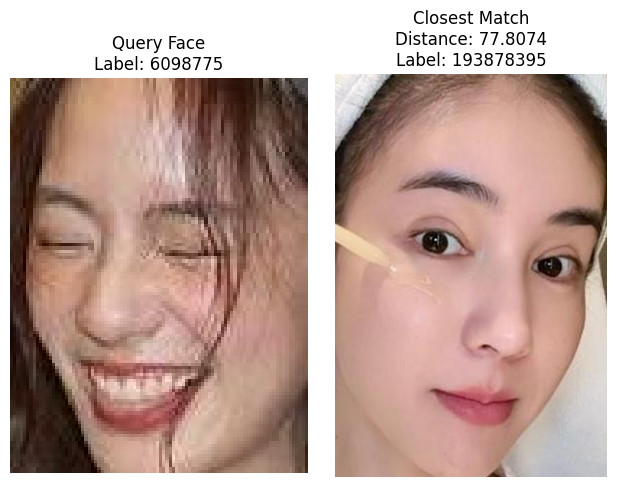

❌GT Celeb ID: 6098775, Predicted Celeb ID: 193878395, Distance: 77.8074


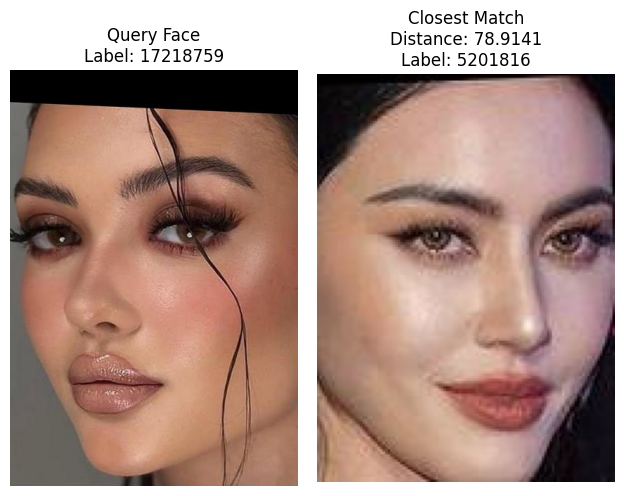

❌GT Celeb ID: 17218759, Predicted Celeb ID: 5201816, Distance: 78.9141


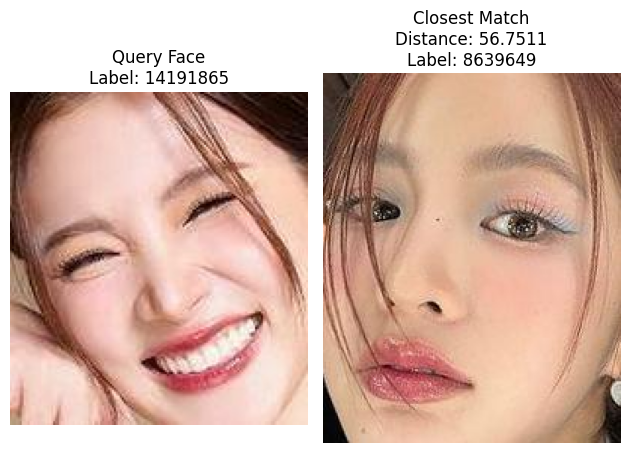

❌GT Celeb ID: 14191865, Predicted Celeb ID: 8639649, Distance: 56.7511


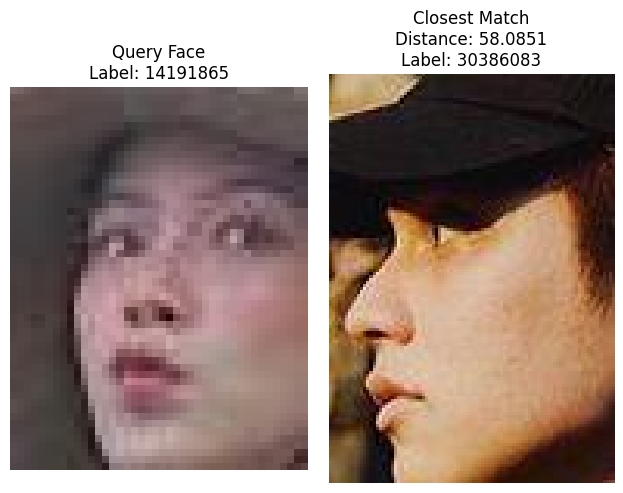

❌GT Celeb ID: 14191865, Predicted Celeb ID: 30386083, Distance: 58.0851


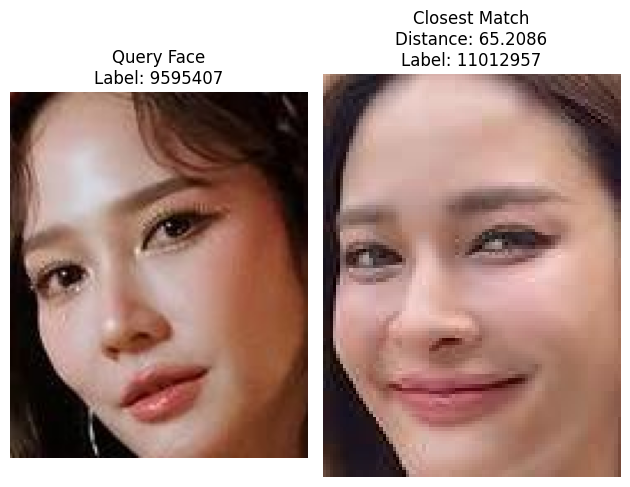

❌GT Celeb ID: 9595407, Predicted Celeb ID: 11012957, Distance: 65.2086


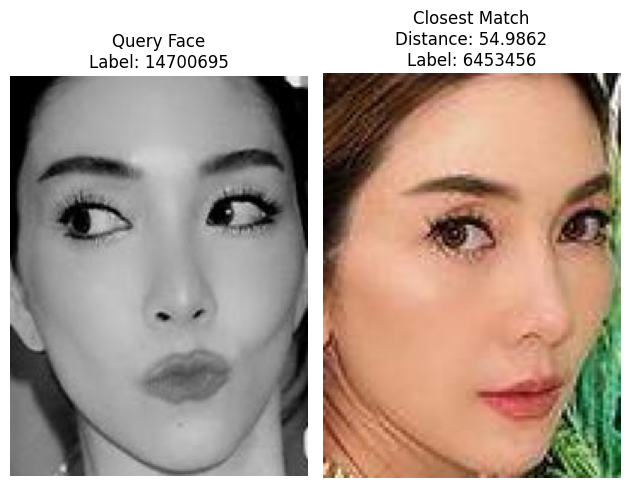

❌GT Celeb ID: 14700695, Predicted Celeb ID: 6453456, Distance: 54.9862


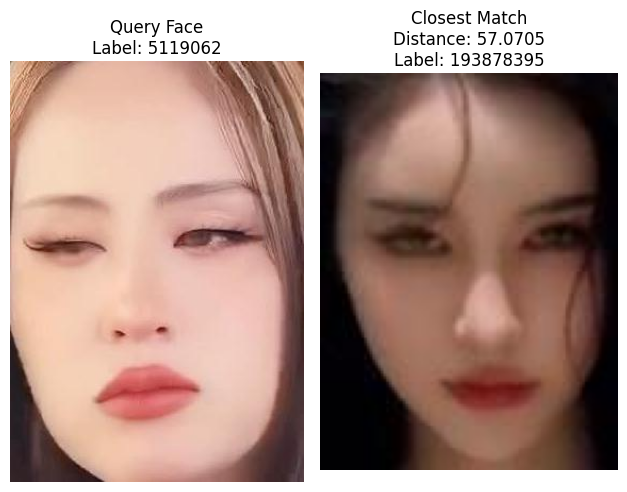

❌GT Celeb ID: 5119062, Predicted Celeb ID: 193878395, Distance: 57.0705


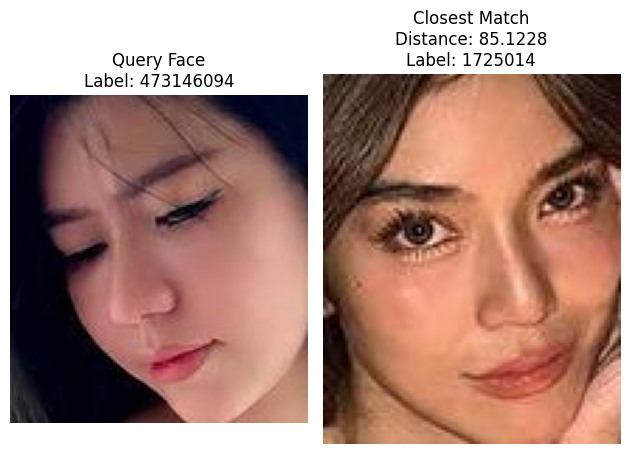

❌GT Celeb ID: 473146094, Predicted Celeb ID: 1725014, Distance: 85.1228


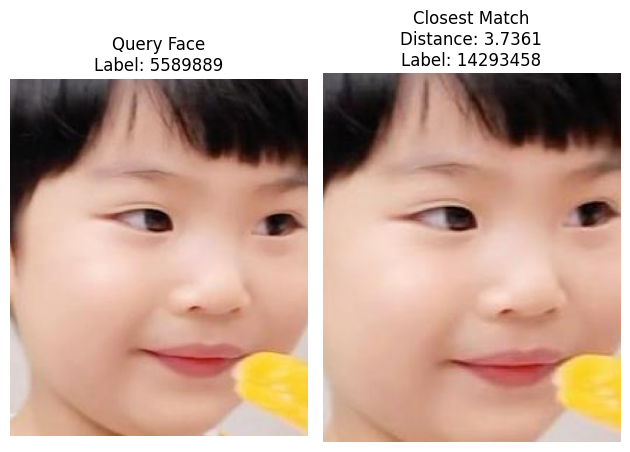

❌GT Celeb ID: 5589889, Predicted Celeb ID: 14293458, Distance: 3.7361


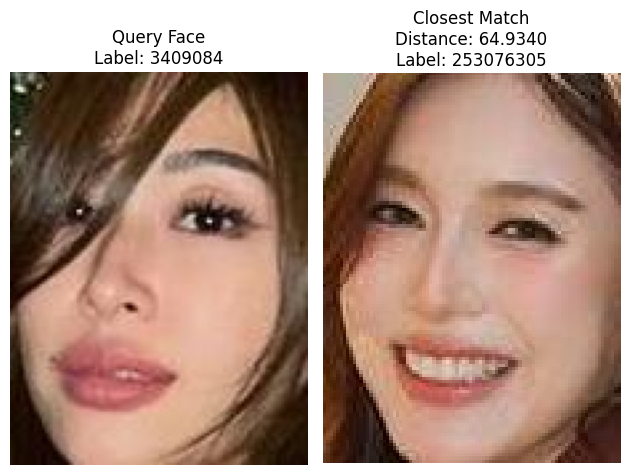

❌GT Celeb ID: 3409084, Predicted Celeb ID: 253076305, Distance: 64.9340


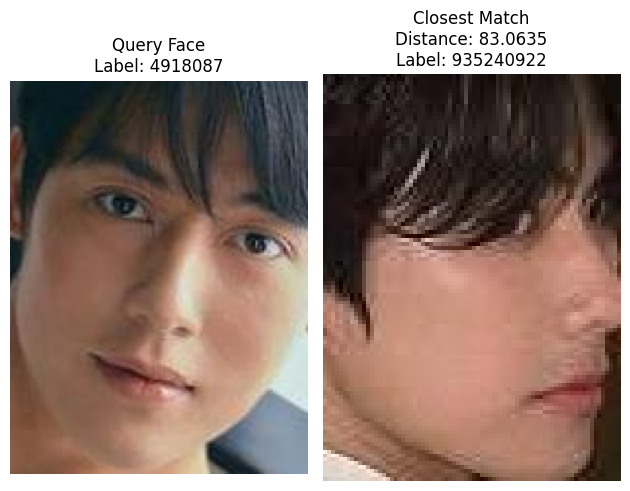

❌GT Celeb ID: 4918087, Predicted Celeb ID: 935240922, Distance: 83.0635


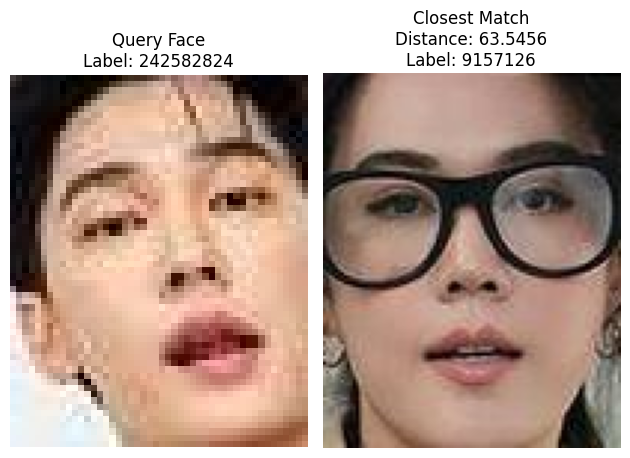

❌GT Celeb ID: 242582824, Predicted Celeb ID: 9157126, Distance: 63.5456


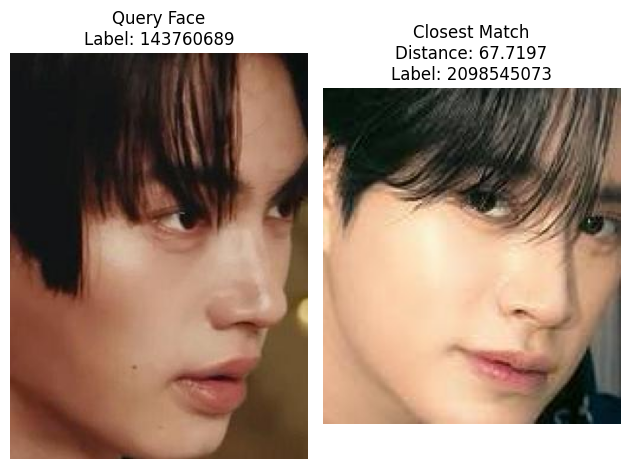

❌GT Celeb ID: 143760689, Predicted Celeb ID: 2098545073, Distance: 67.7197


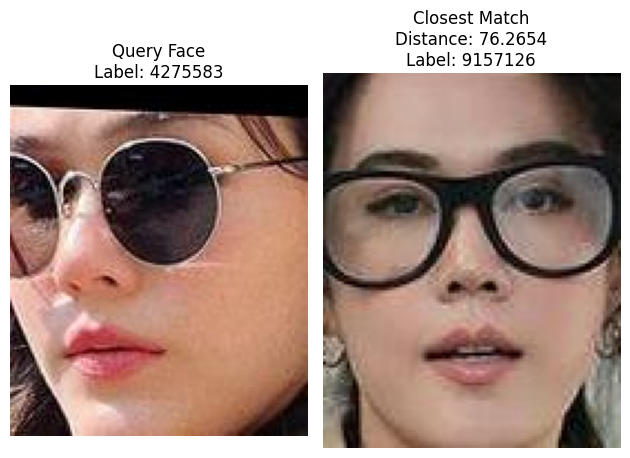

❌GT Celeb ID: 4275583, Predicted Celeb ID: 9157126, Distance: 76.2654


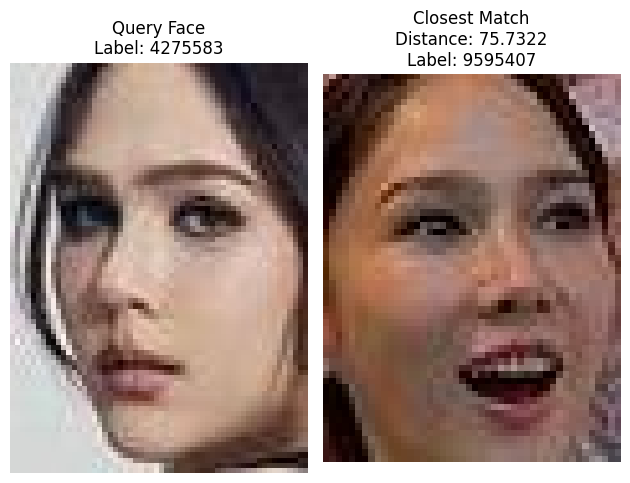

❌GT Celeb ID: 4275583, Predicted Celeb ID: 9595407, Distance: 75.7322


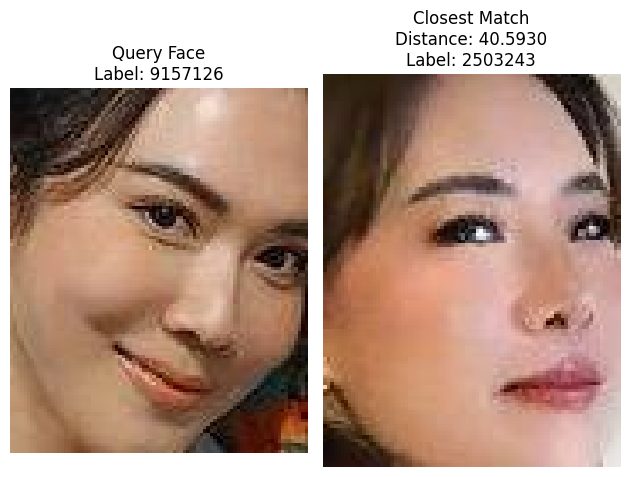

❌GT Celeb ID: 9157126, Predicted Celeb ID: 2503243, Distance: 40.5930


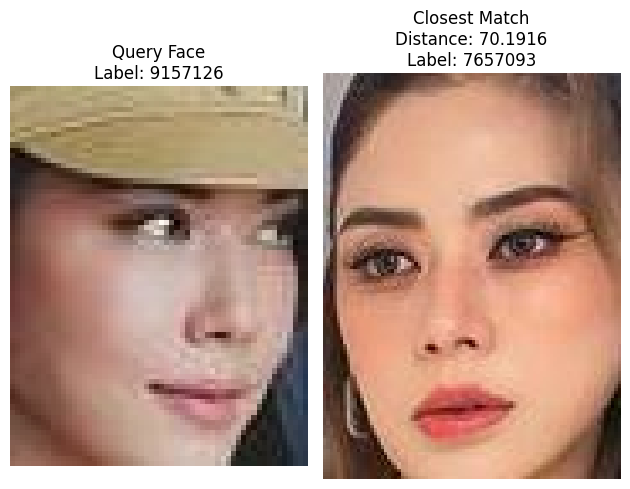

❌GT Celeb ID: 9157126, Predicted Celeb ID: 7657093, Distance: 70.1916


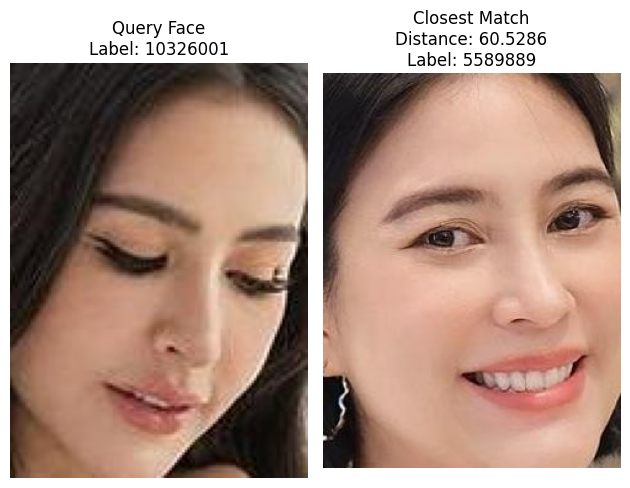

❌GT Celeb ID: 10326001, Predicted Celeb ID: 5589889, Distance: 60.5286


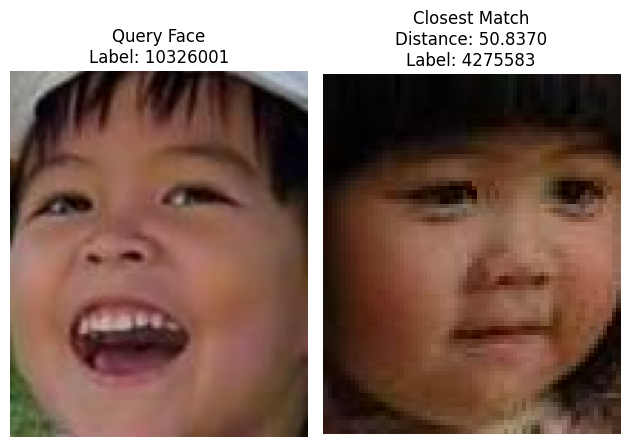

❌GT Celeb ID: 10326001, Predicted Celeb ID: 4275583, Distance: 50.8370


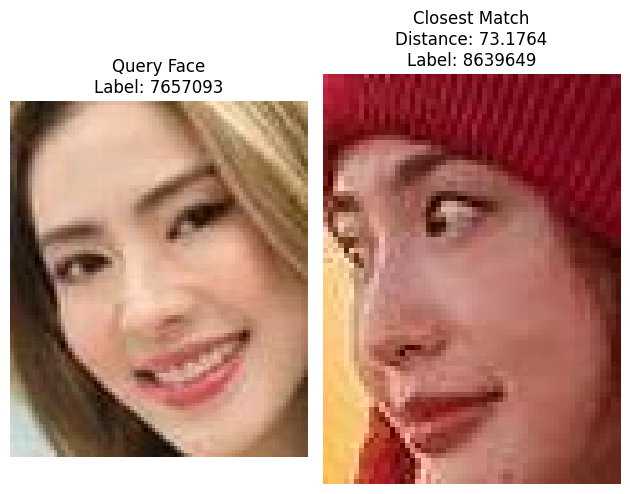

❌GT Celeb ID: 7657093, Predicted Celeb ID: 8639649, Distance: 73.1764


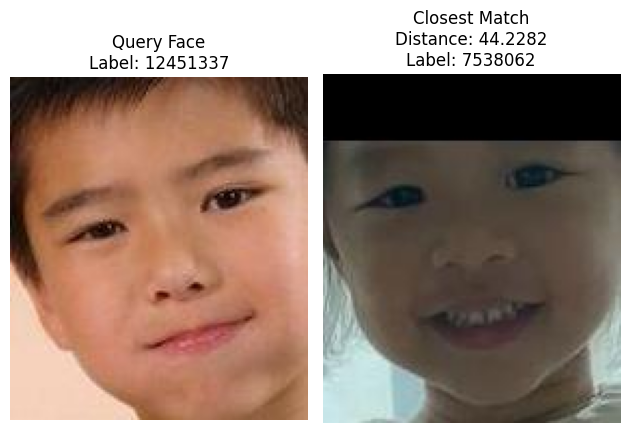

❌GT Celeb ID: 12451337, Predicted Celeb ID: 7538062, Distance: 44.2282


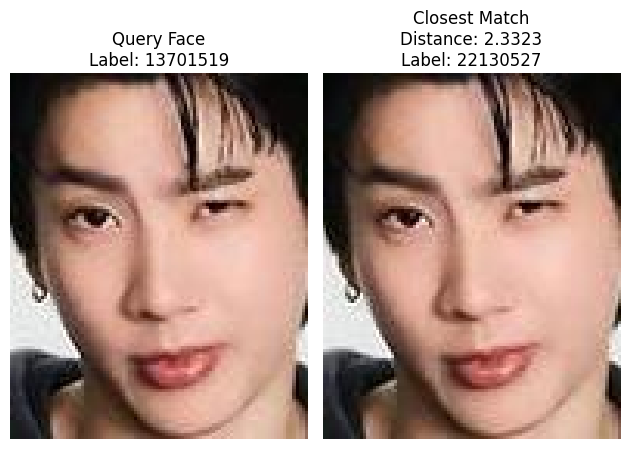

❌GT Celeb ID: 13701519, Predicted Celeb ID: 22130527, Distance: 2.3323


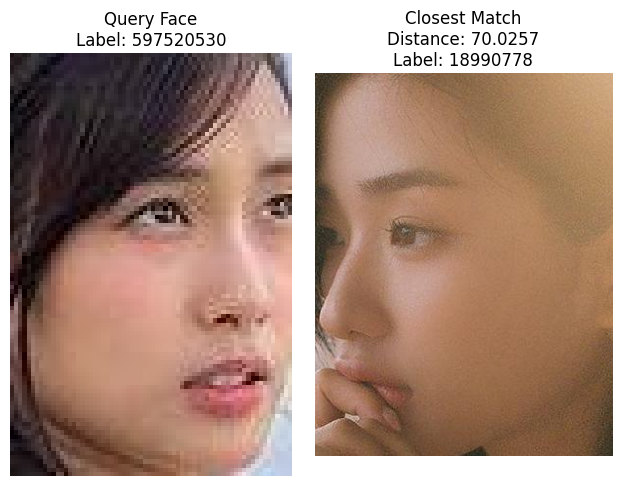

❌GT Celeb ID: 597520530, Predicted Celeb ID: 18990778, Distance: 70.0257


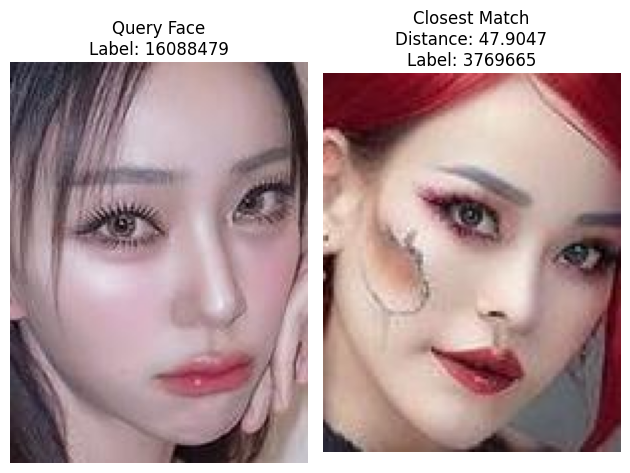

❌GT Celeb ID: 16088479, Predicted Celeb ID: 3769665, Distance: 47.9047


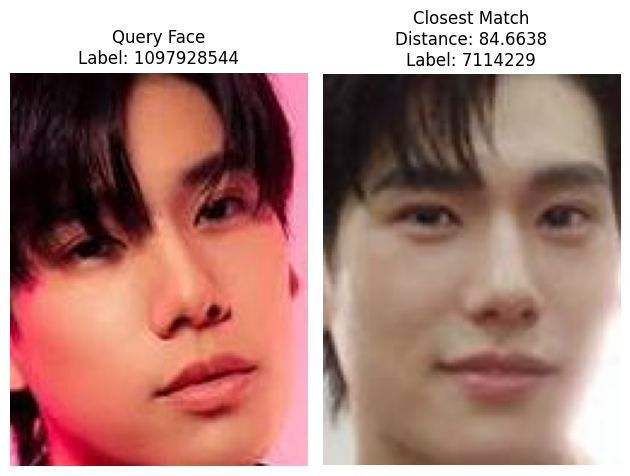

❌GT Celeb ID: 1097928544, Predicted Celeb ID: 7114229, Distance: 84.6638


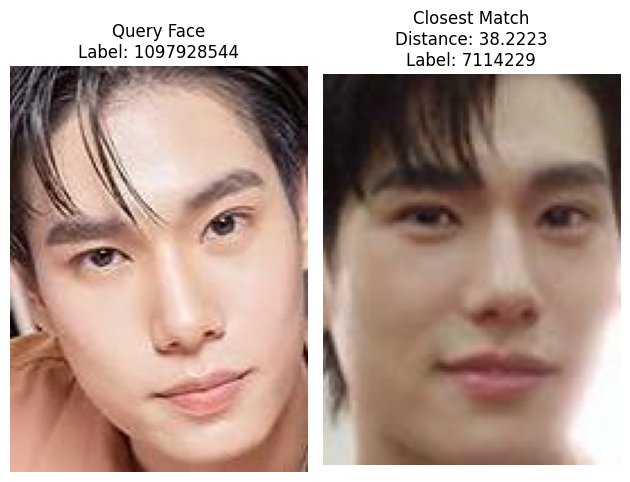

❌GT Celeb ID: 1097928544, Predicted Celeb ID: 7114229, Distance: 38.2223


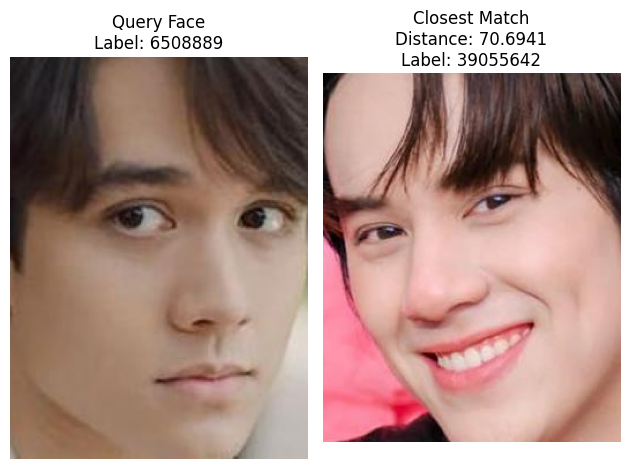

❌GT Celeb ID: 6508889, Predicted Celeb ID: 39055642, Distance: 70.6941


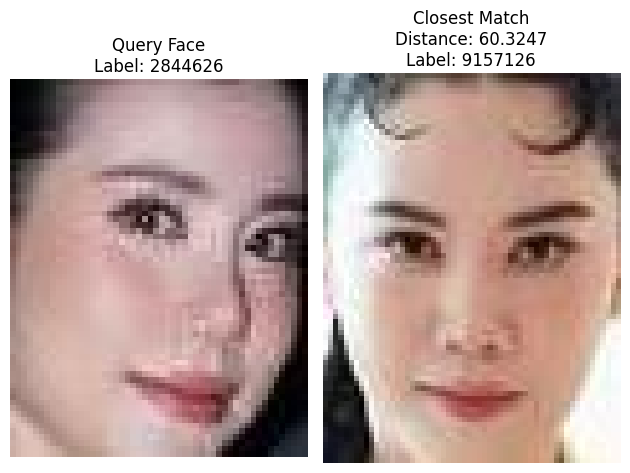

❌GT Celeb ID: 2844626, Predicted Celeb ID: 9157126, Distance: 60.3247


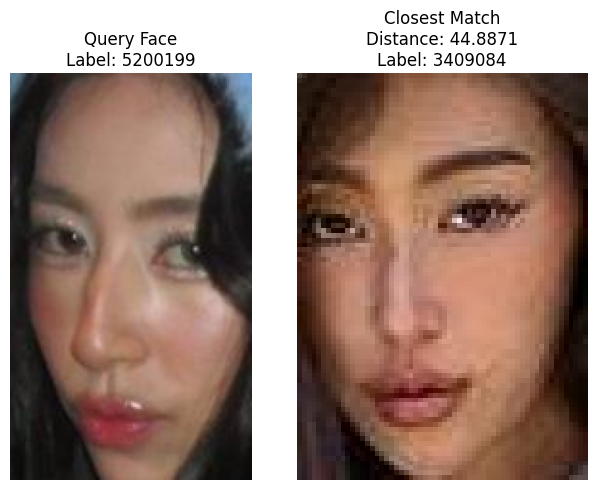

❌GT Celeb ID: 5200199, Predicted Celeb ID: 3409084, Distance: 44.8871


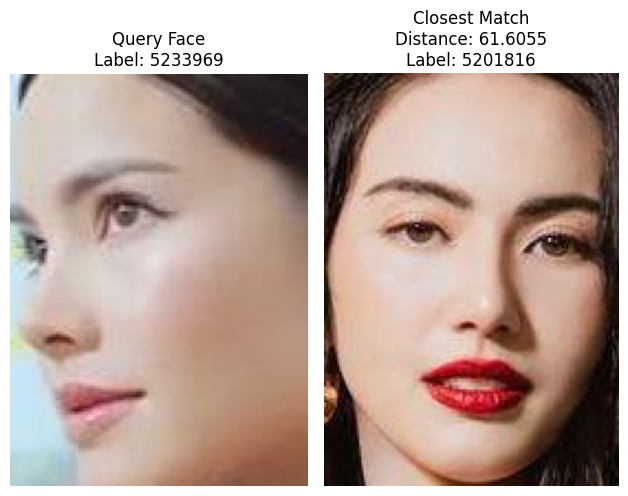

❌GT Celeb ID: 5233969, Predicted Celeb ID: 5201816, Distance: 61.6055


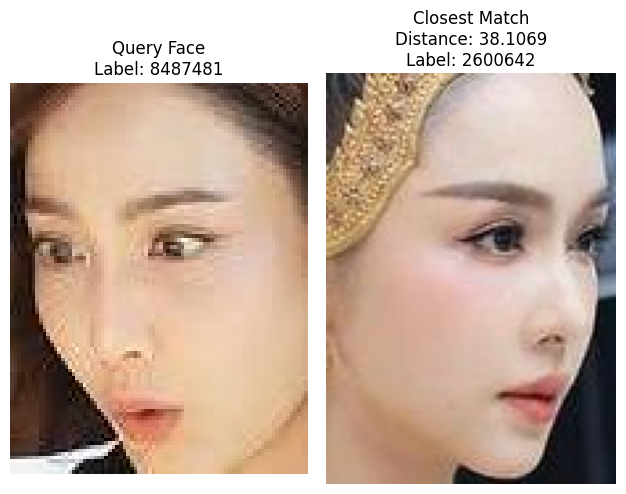

❌GT Celeb ID: 8487481, Predicted Celeb ID: 2600642, Distance: 38.1069


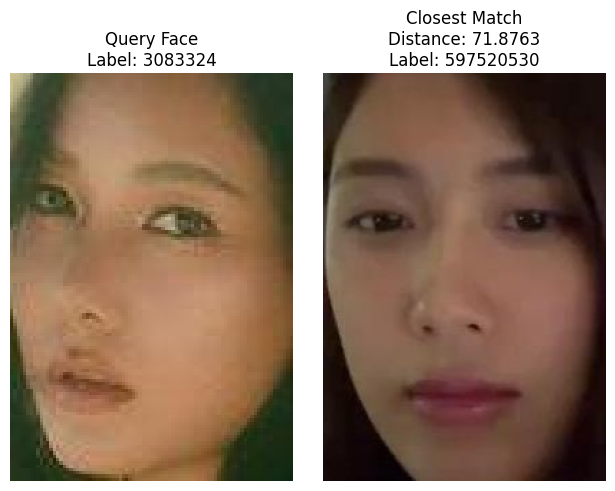

❌GT Celeb ID: 3083324, Predicted Celeb ID: 597520530, Distance: 71.8763


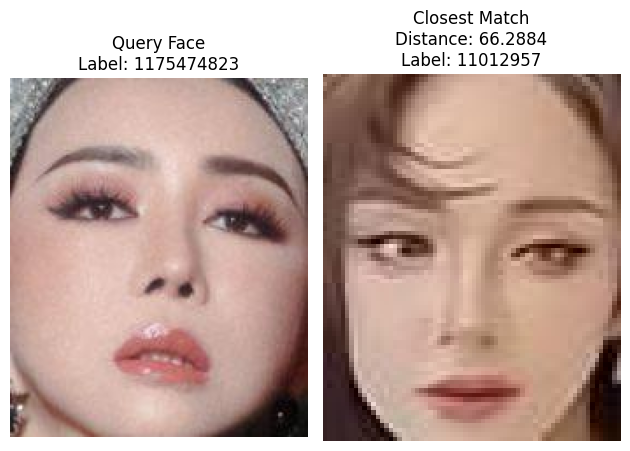

❌GT Celeb ID: 1175474823, Predicted Celeb ID: 11012957, Distance: 66.2884


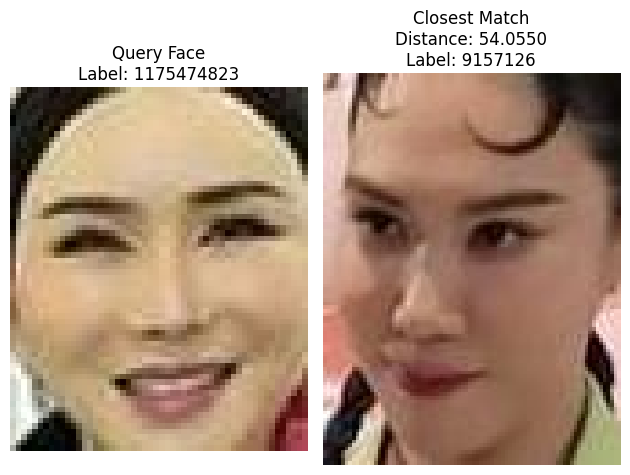

❌GT Celeb ID: 1175474823, Predicted Celeb ID: 9157126, Distance: 54.0550


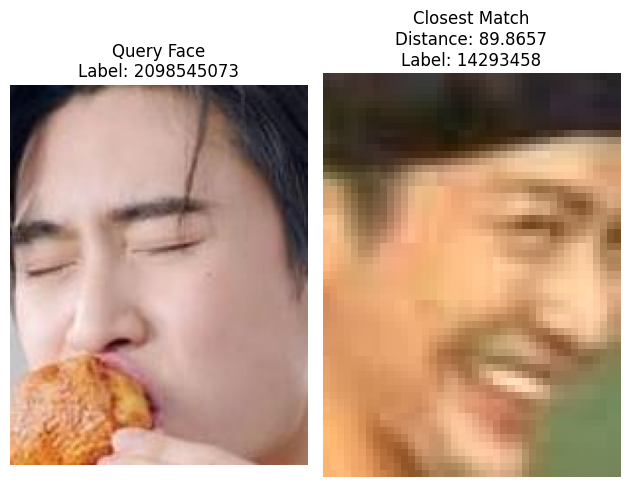

❌GT Celeb ID: 2098545073, Predicted Celeb ID: 14293458, Distance: 89.8657


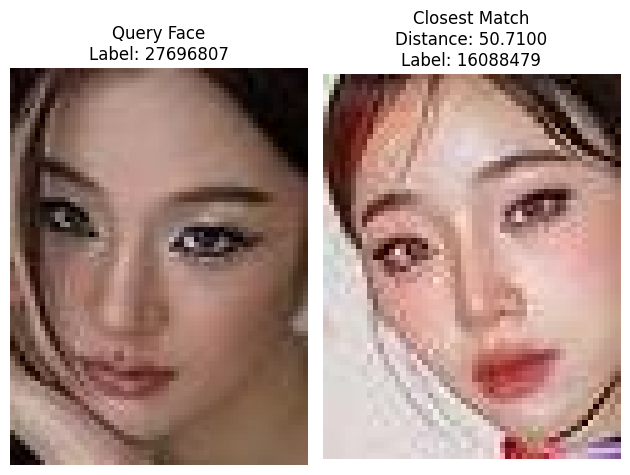

❌GT Celeb ID: 27696807, Predicted Celeb ID: 16088479, Distance: 50.7100


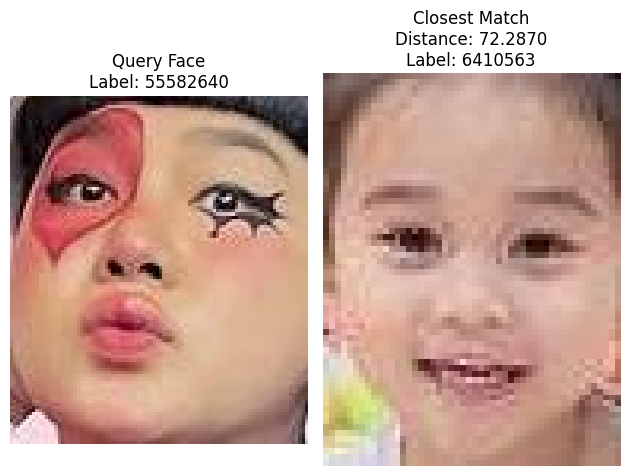

❌GT Celeb ID: 55582640, Predicted Celeb ID: 6410563, Distance: 72.2870


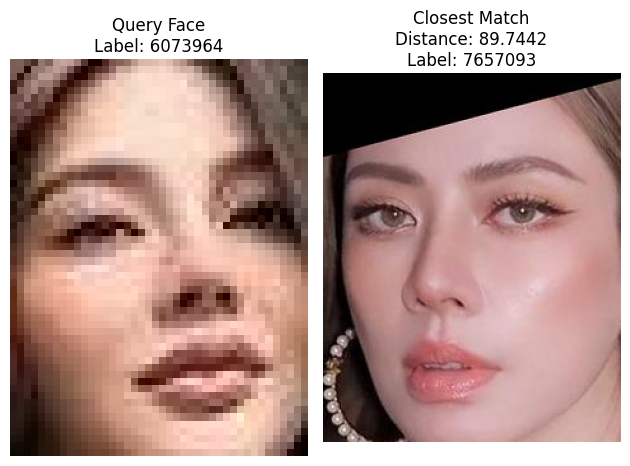

❌GT Celeb ID: 6073964, Predicted Celeb ID: 7657093, Distance: 89.7442


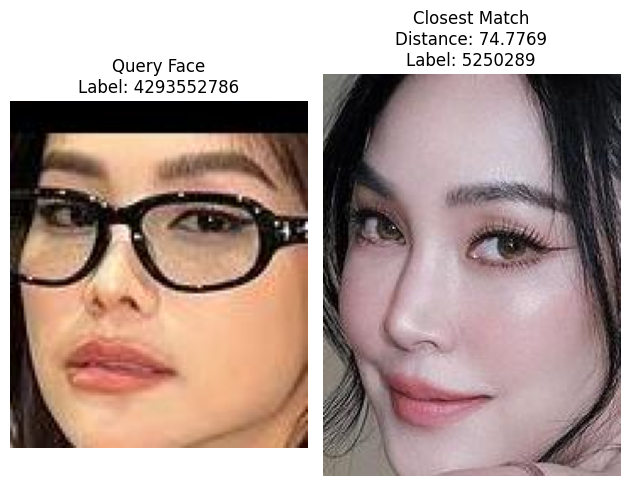

❌GT Celeb ID: 4293552786, Predicted Celeb ID: 5250289, Distance: 74.7769


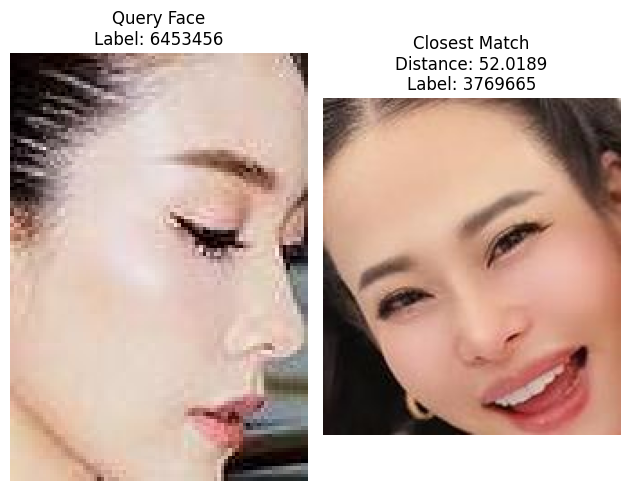

❌GT Celeb ID: 6453456, Predicted Celeb ID: 3769665, Distance: 52.0189


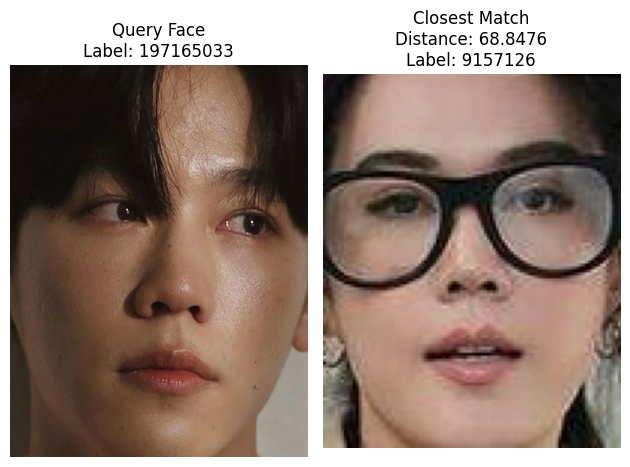

❌GT Celeb ID: 197165033, Predicted Celeb ID: 9157126, Distance: 68.8476


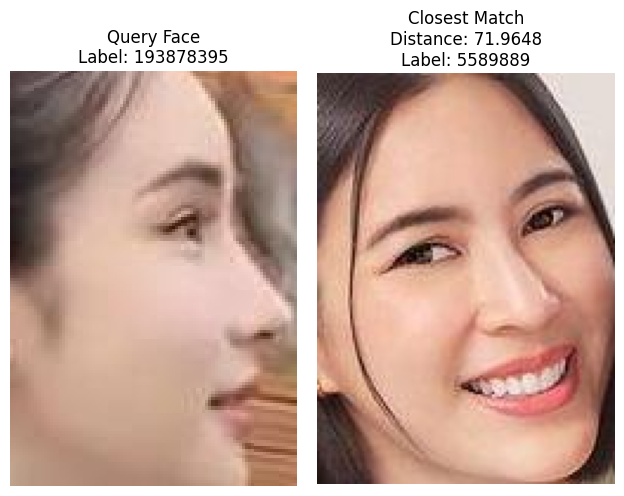

❌GT Celeb ID: 193878395, Predicted Celeb ID: 5589889, Distance: 71.9648


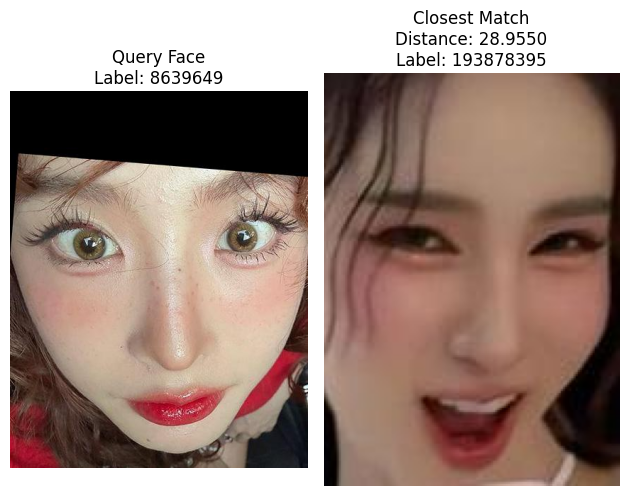

❌GT Celeb ID: 8639649, Predicted Celeb ID: 193878395, Distance: 28.9550


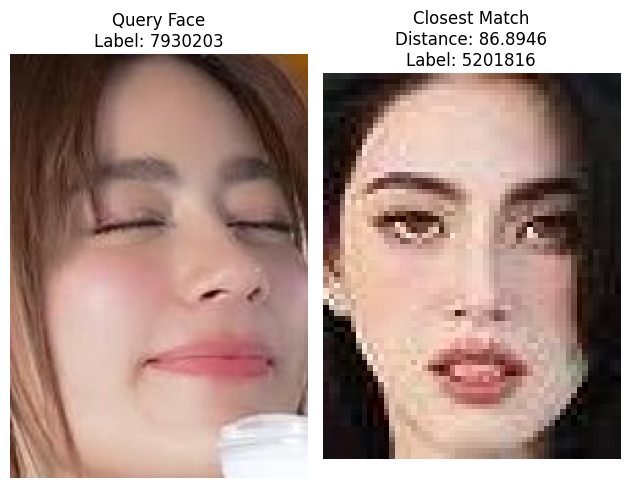

❌GT Celeb ID: 7930203, Predicted Celeb ID: 5201816, Distance: 86.8946


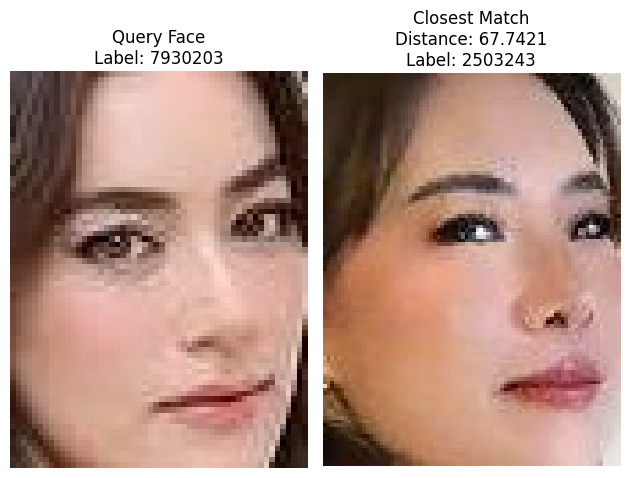

❌GT Celeb ID: 7930203, Predicted Celeb ID: 2503243, Distance: 67.7421


In [6]:
for i, (image, face, distance, label, matched_face_id) in enumerate(zip(used_images, used_faces,
                                                                        predicted_distances, predicted_labels,
                                                                        matched_face_ids)):
    gt_celeb_id = image.celeb_id
    predicted_celeb_id = label

    # FP case
    if distance < config.L2_threshold and gt_celeb_id != predicted_celeb_id:
        with session_maker() as session:
            stmt = select(Face).where(Face.id == matched_face_id)
            matched_face = session.execute(stmt).scalar_one_or_none()

        query_image_path = os.path.join(config.preprocessed_dataset_dir, face.face_image_path)
        matched_image_path = os.path.join(config.preprocessed_dataset_dir, matched_face.face_image_path)
        display_face_comparison(query_image_path, matched_image_path, distance, gt_celeb_id, predicted_celeb_id)
        print(f'❌GT Celeb ID: {gt_celeb_id}, Predicted Celeb ID: {predicted_celeb_id}, Distance: {distance:.4f}')

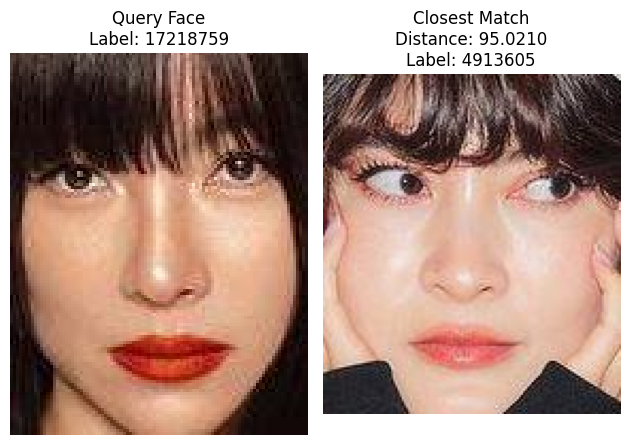

❌GT Celeb ID: 17218759, Predicted Celeb ID: 4913605, Distance: 95.0210


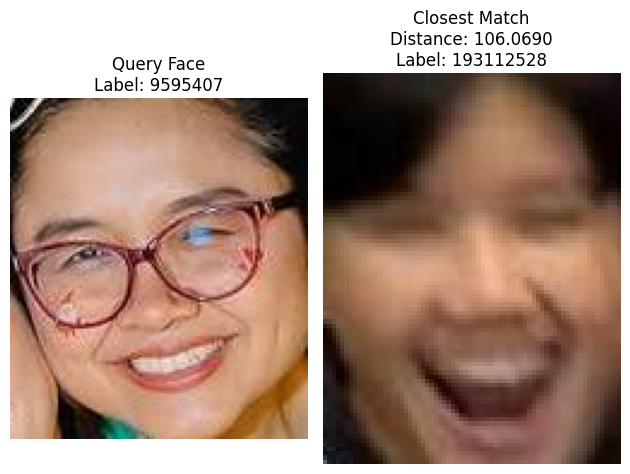

❌GT Celeb ID: 9595407, Predicted Celeb ID: 193112528, Distance: 106.0690


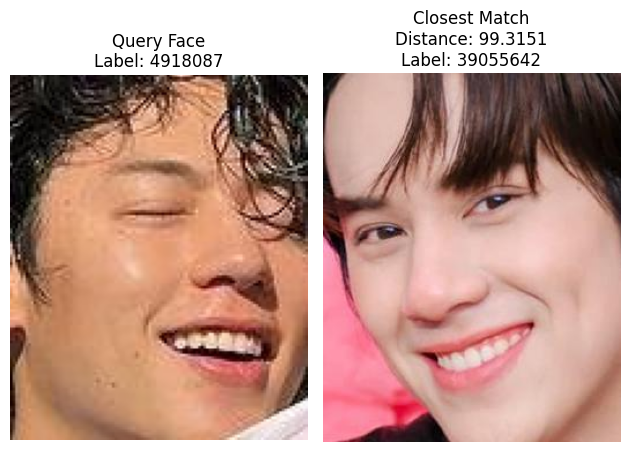

❌GT Celeb ID: 4918087, Predicted Celeb ID: 39055642, Distance: 99.3151


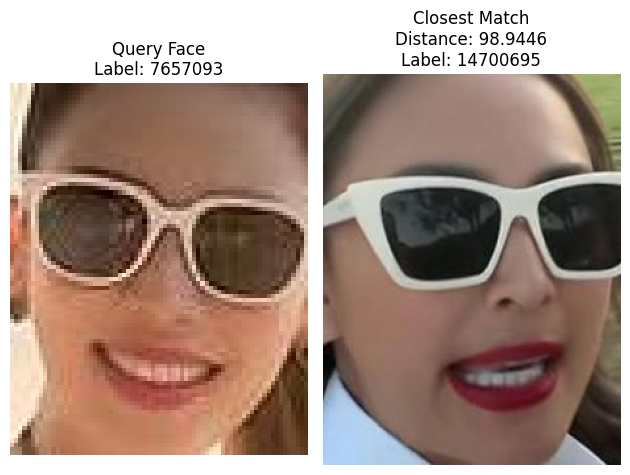

❌GT Celeb ID: 7657093, Predicted Celeb ID: 14700695, Distance: 98.9446


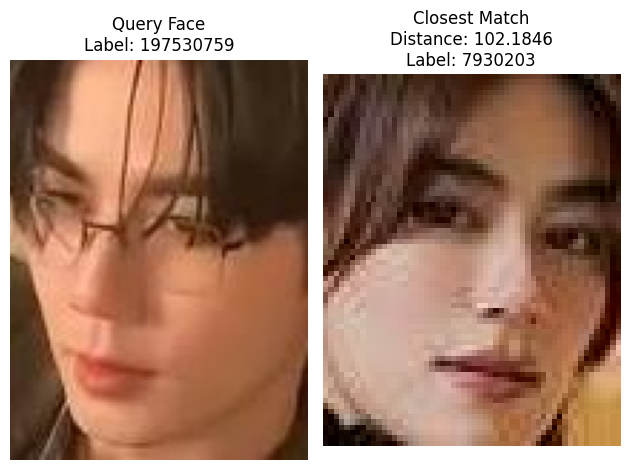

❌GT Celeb ID: 197530759, Predicted Celeb ID: 7930203, Distance: 102.1846


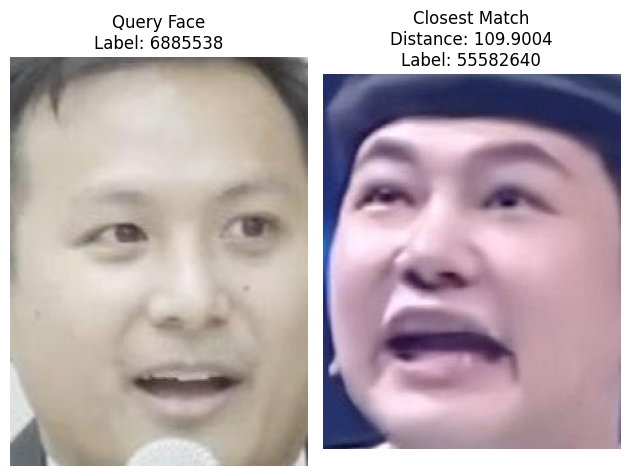

❌GT Celeb ID: 6885538, Predicted Celeb ID: 55582640, Distance: 109.9004


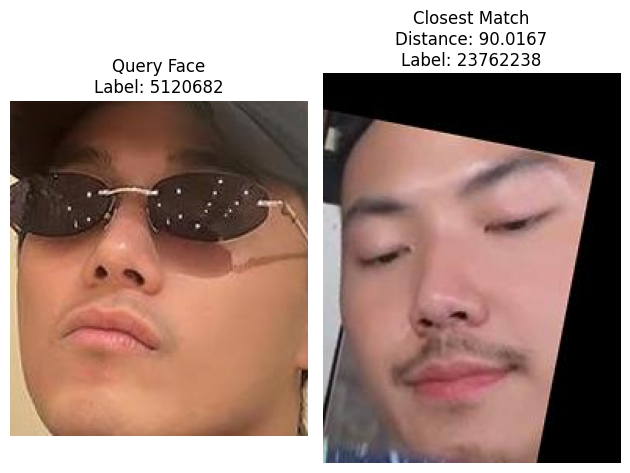

❌GT Celeb ID: 5120682, Predicted Celeb ID: 23762238, Distance: 90.0167


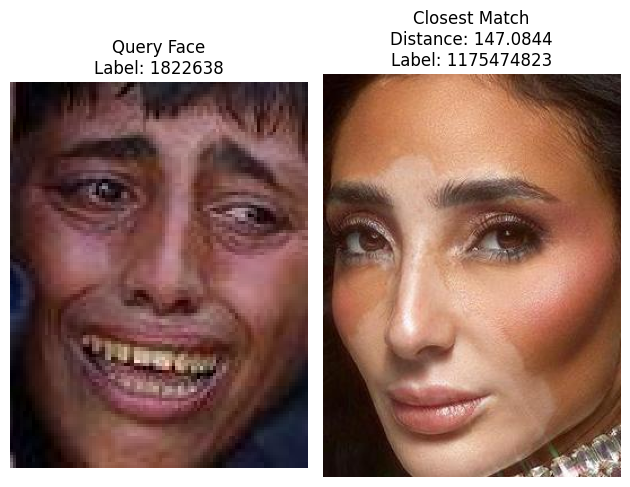

❌GT Celeb ID: 1822638, Predicted Celeb ID: 1175474823, Distance: 147.0844


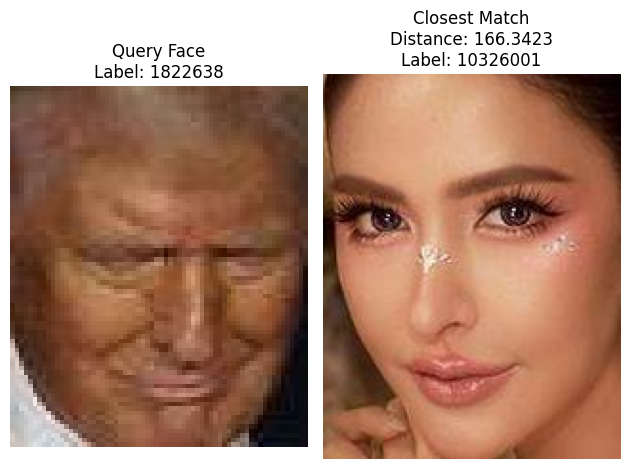

❌GT Celeb ID: 1822638, Predicted Celeb ID: 10326001, Distance: 166.3423


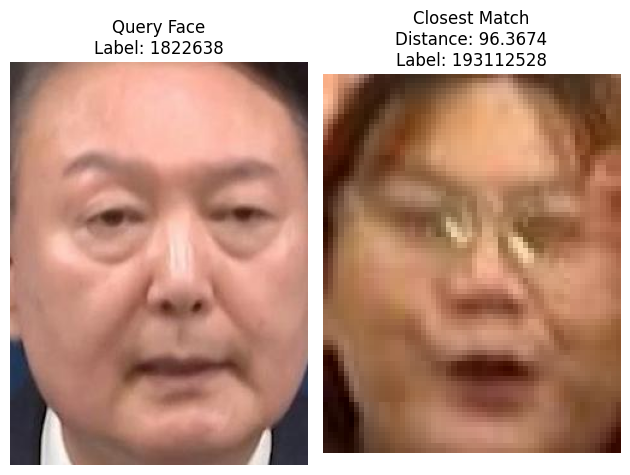

❌GT Celeb ID: 1822638, Predicted Celeb ID: 193112528, Distance: 96.3674


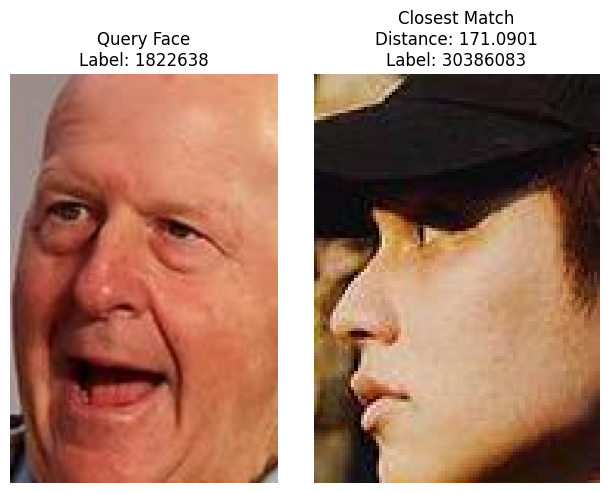

❌GT Celeb ID: 1822638, Predicted Celeb ID: 30386083, Distance: 171.0901


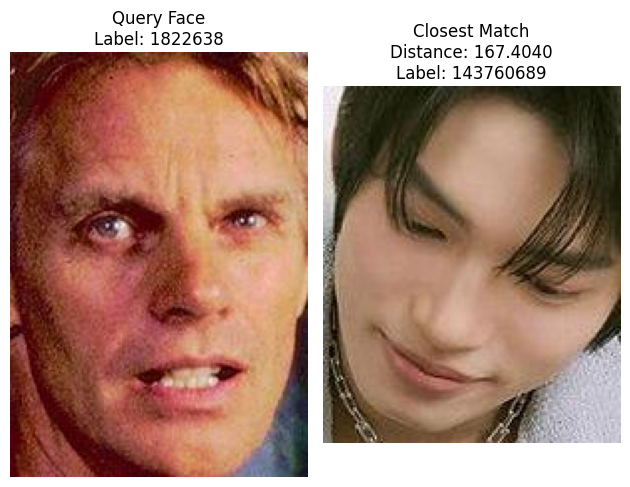

❌GT Celeb ID: 1822638, Predicted Celeb ID: 143760689, Distance: 167.4040


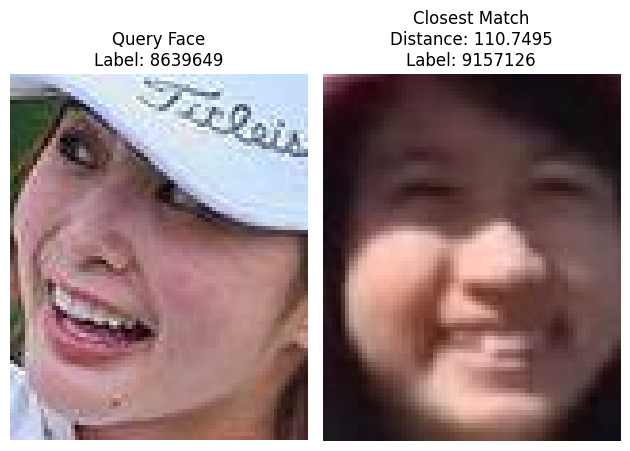

❌GT Celeb ID: 8639649, Predicted Celeb ID: 9157126, Distance: 110.7495


In [7]:
for i, (image, face, distance, label, matched_face_id) in enumerate(zip(used_images, used_faces,
                                                                        predicted_distances, predicted_labels,
                                                                        matched_face_ids)):
    gt_celeb_id = image.celeb_id
    predicted_celeb_id = label

    # FN case
    if distance > config.L2_threshold and gt_celeb_id != predicted_celeb_id:
        with session_maker() as session:
            stmt = select(Face).where(Face.id == matched_face_id)
            matched_face = session.execute(stmt).scalar_one_or_none()

        query_image_path = os.path.join(config.preprocessed_dataset_dir, face.face_image_path)
        matched_image_path = os.path.join(config.preprocessed_dataset_dir, matched_face.face_image_path)
        display_face_comparison(query_image_path, matched_image_path, distance, gt_celeb_id, predicted_celeb_id)
        print(f'❌GT Celeb ID: {gt_celeb_id}, Predicted Celeb ID: {predicted_celeb_id}, Distance: {distance:.4f}')

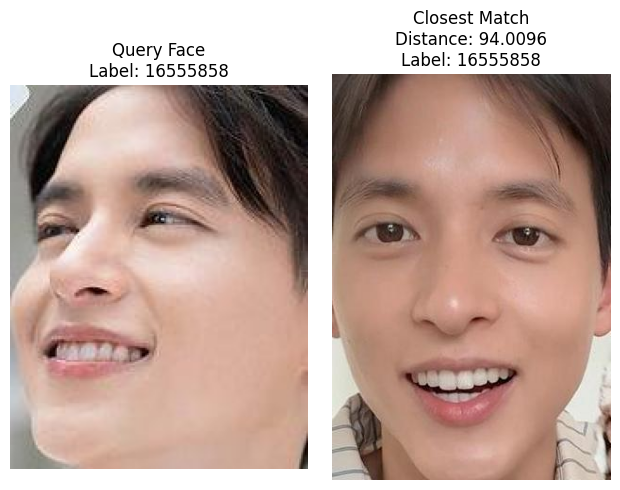

❌GT Celeb ID: 16555858, Predicted Celeb ID: 16555858, Distance: 94.0096


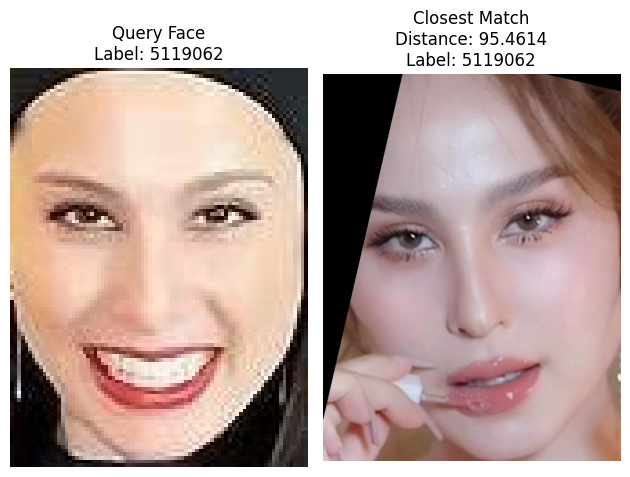

❌GT Celeb ID: 5119062, Predicted Celeb ID: 5119062, Distance: 95.4614


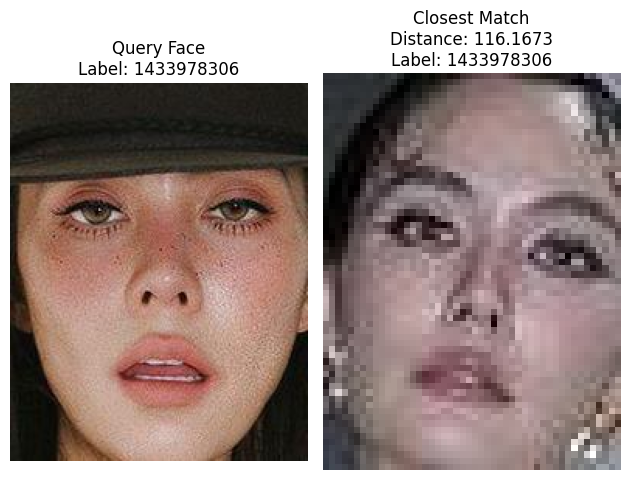

❌GT Celeb ID: 1433978306, Predicted Celeb ID: 1433978306, Distance: 116.1673


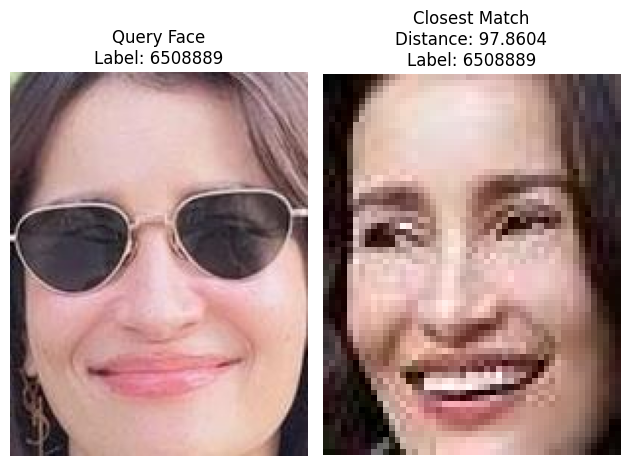

❌GT Celeb ID: 6508889, Predicted Celeb ID: 6508889, Distance: 97.8604


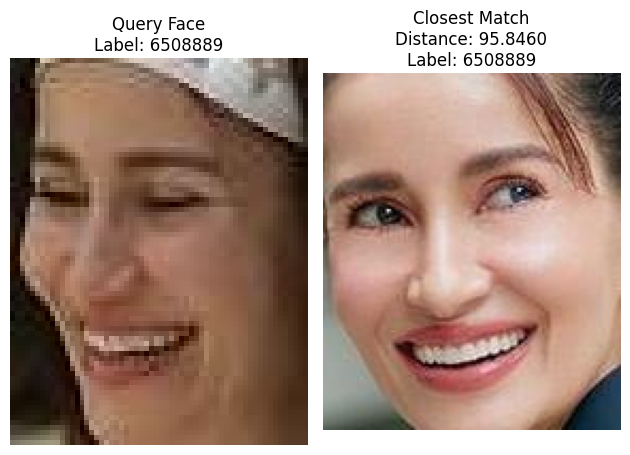

❌GT Celeb ID: 6508889, Predicted Celeb ID: 6508889, Distance: 95.8460


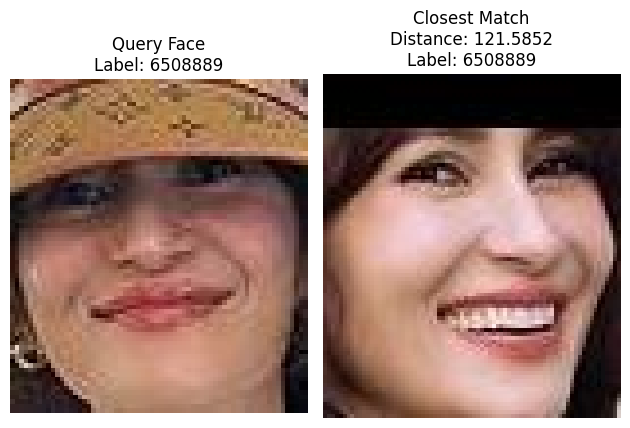

❌GT Celeb ID: 6508889, Predicted Celeb ID: 6508889, Distance: 121.5852


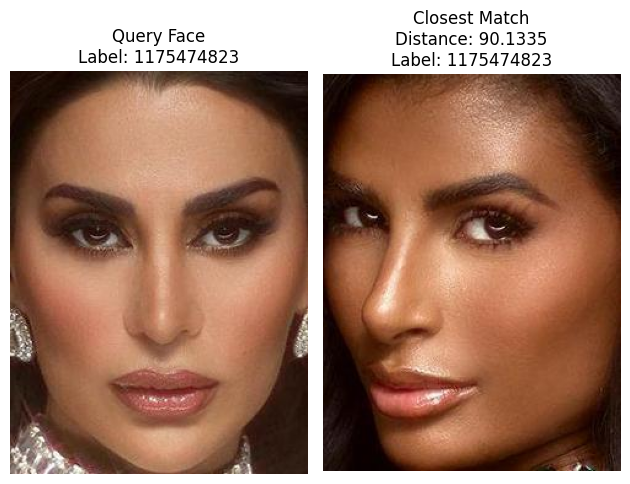

❌GT Celeb ID: 1175474823, Predicted Celeb ID: 1175474823, Distance: 90.1335


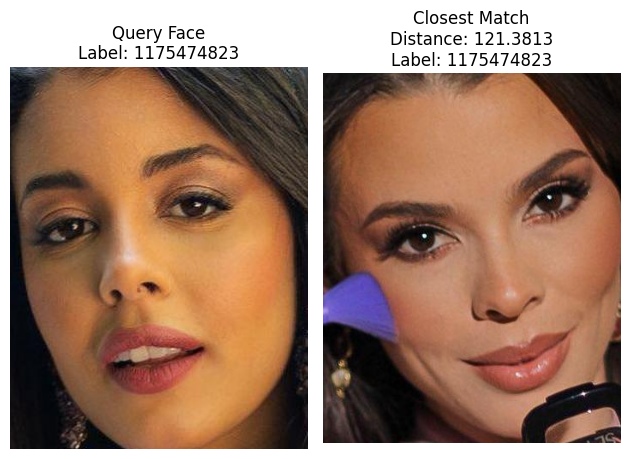

❌GT Celeb ID: 1175474823, Predicted Celeb ID: 1175474823, Distance: 121.3813


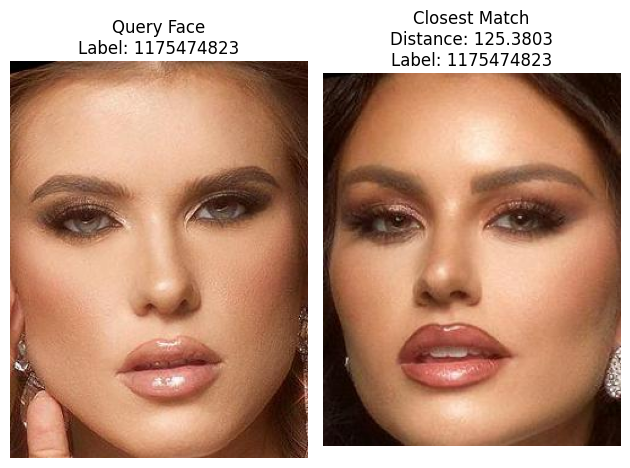

❌GT Celeb ID: 1175474823, Predicted Celeb ID: 1175474823, Distance: 125.3803


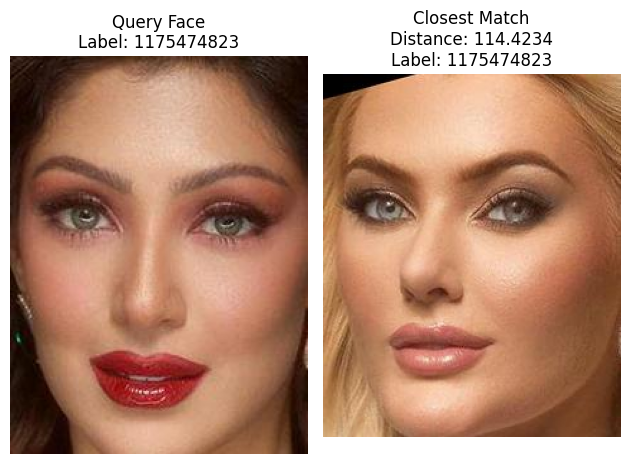

❌GT Celeb ID: 1175474823, Predicted Celeb ID: 1175474823, Distance: 114.4234


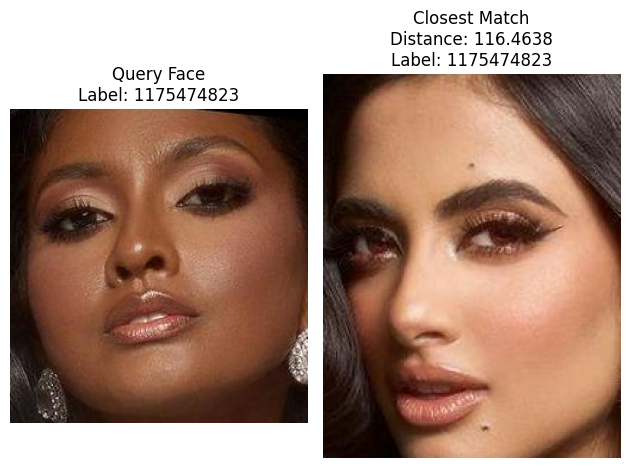

❌GT Celeb ID: 1175474823, Predicted Celeb ID: 1175474823, Distance: 116.4638


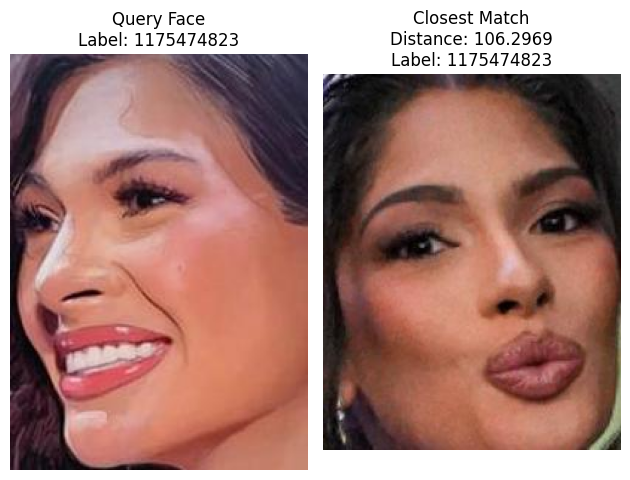

❌GT Celeb ID: 1175474823, Predicted Celeb ID: 1175474823, Distance: 106.2969


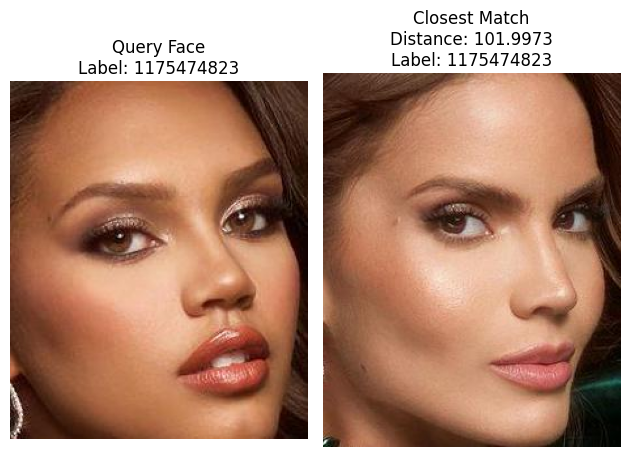

❌GT Celeb ID: 1175474823, Predicted Celeb ID: 1175474823, Distance: 101.9973


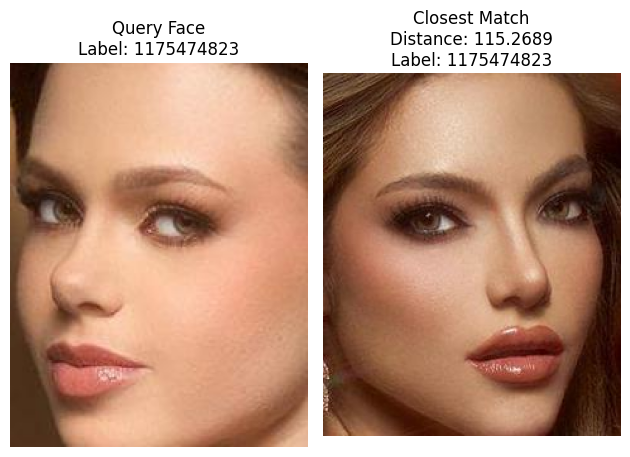

❌GT Celeb ID: 1175474823, Predicted Celeb ID: 1175474823, Distance: 115.2689


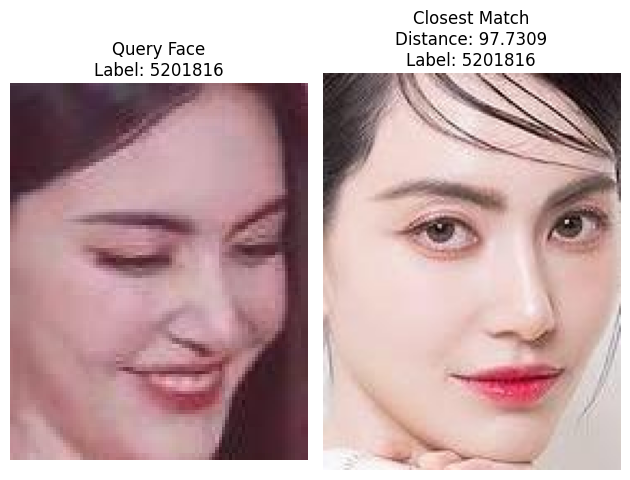

❌GT Celeb ID: 5201816, Predicted Celeb ID: 5201816, Distance: 97.7309


In [8]:
for i, (image, face, distance, label, matched_face_id) in enumerate(zip(used_images, used_faces,
                                                                        predicted_distances, predicted_labels,
                                                                        matched_face_ids)):
    gt_celeb_id = image.celeb_id
    predicted_celeb_id = label

    # FN case
    if distance > config.L2_threshold and gt_celeb_id == predicted_celeb_id:
        with session_maker() as session:
            stmt = select(Face).where(Face.id == matched_face_id)
            matched_face = session.execute(stmt).scalar_one_or_none()

        query_image_path = os.path.join(config.preprocessed_dataset_dir, face.face_image_path)
        matched_image_path = os.path.join(config.preprocessed_dataset_dir, matched_face.face_image_path)
        display_face_comparison(query_image_path, matched_image_path, distance, gt_celeb_id, predicted_celeb_id)
        print(f'❌GT Celeb ID: {gt_celeb_id}, Predicted Celeb ID: {predicted_celeb_id}, Distance: {distance:.4f}')